In [11]:
import numpy as np
import matplotlib.pyplot as plt
import scipy.io as sio
from os.path import dirname, join as pjoin
%matplotlib notebook

In [15]:
mat_fname=pjoin('C:/Users/az652\OneDrive\桌面','20190408_HMM_G5_sort_unit1.mat')
mat_contents=sio.loadmat(mat_fname)
Spikes = mat_contents['Spikes']
a_data = mat_contents['a_data']
TimeStamps = mat_contents['TimeStamps']
print(Spikes.dtype)
print(Spikes[0,0].dtype)
print(TimeStamps.shape)

object
float64
(1, 2)


In [16]:
print(a_data)
print(a_data.shape)
print(a_data[2,0:])

[[32616 32604 32604 ... 32616 32616 32616]
 [32772 32768 32760 ... 32772 32776 32772]
 [32736 32732 32736 ... 32732 32728 32732]]
(3, 6938000)
[32736 32732 32736 ... 32732 32728 32732]


In [17]:
a_data3=a_data[2,0:]
rate=20000
t=np.arange(1,len(a_data3)+1)/rate
print(t)
print(t.shape)
plt.plot(t,a_data3)
plt.show

[5.0000000e-05 1.0000000e-04 1.5000000e-04 ... 3.4689990e+02 3.4689995e+02
 3.4690000e+02]
(6938000,)


<IPython.core.display.Javascript object>

<function matplotlib.pyplot.show(*args, **kw)>

<IPython.core.display.Javascript object>

In [5]:
tcut=t[(t>TimeStamps[0,0]) & (t<TimeStamps[0,1])]-TimeStamps[0,0]
Xsti=a_data3[(t>TimeStamps[0,0]) & (t<TimeStamps[0,1])]
print(tcut)
plt.plot(tcut,Xsti)
plt.show

[5.0000000e-05 1.0000000e-04 1.5000000e-04 ... 2.9908700e+02 2.9908705e+02
 2.9908710e+02]


<function matplotlib.pyplot.show(*args, **kw)>

<function matplotlib.pyplot.show(*args, **kw)>

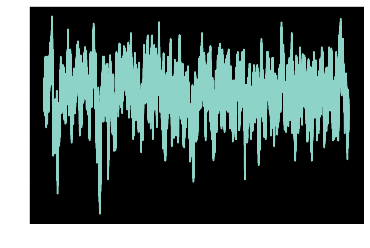

In [12]:
# normalize Xstimulation 
Xsti=Xsti-np.mean(Xsti)
Xsti=Xsti/np.std(Xsti)
plt.plot(tcut,Xsti)
#plt.xlim(100,100.001)
#plt.ylim(-2,0)
plt.show

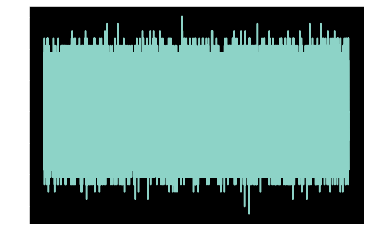

In [13]:
# speed of Xstimulation
Vsti=np.diff(Xsti)
Vsti=Vsti/np.std(Vsti)
plt.plot(tcut[0:-1],Vsti)
plt.show()


In [14]:
print(tcut.shape)

(5981742,)


In [15]:
# spikes binning
"""bininterval=0.05
bintime=np.arange(0,tcut[-1],bininterval)
print(Spikes.shape)
SpikesBinningAll=[]
for i in range(60):
    SpikesSingleChannel=[]
    SpikesBinning=[]
    SpikesSingleChannel=np.squeeze(Spikes[0,i])
    SpikesBinning=np.histogram(SpikesSingleChannel,bins=bintime)
    SpikesBinningAll.append(SpikesBinning)"""

'bininterval=0.05\nbintime=np.arange(0,tcut[-1],bininterval)\nprint(Spikes.shape)\nSpikesBinningAll=[]\nfor i in range(60):\n    SpikesSingleChannel=[]\n    SpikesBinning=[]\n    SpikesSingleChannel=np.squeeze(Spikes[0,i])\n    SpikesBinning=np.histogram(SpikesSingleChannel,bins=bintime)\n    SpikesBinningAll.append(SpikesBinning)'

In [16]:
#plt.plot(SpikesBinningAll[1][0])
#plt.show()

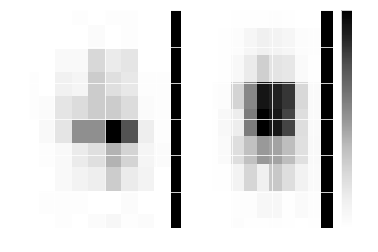

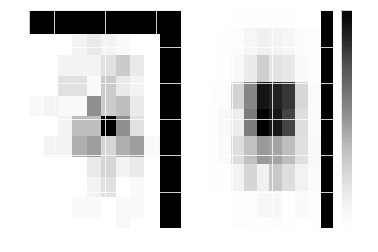

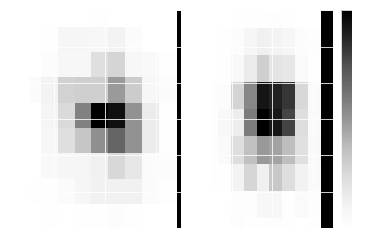

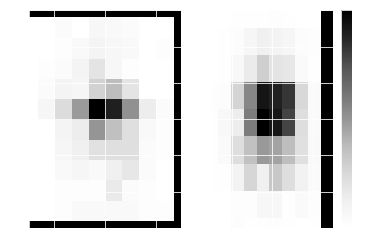

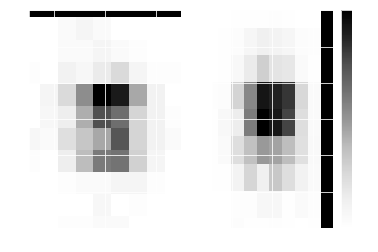

...

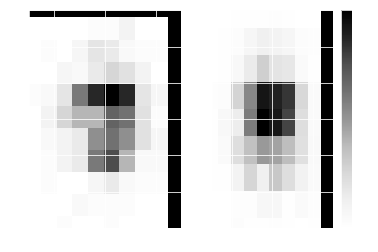

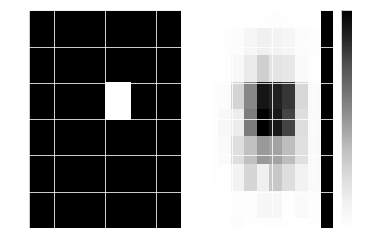

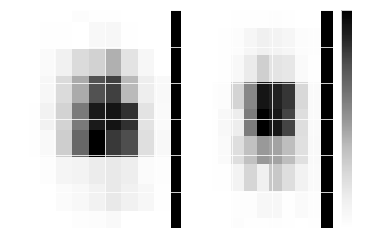

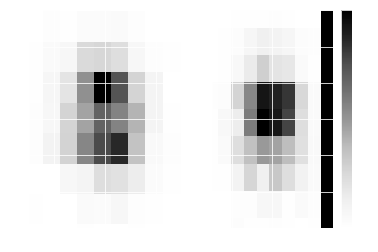

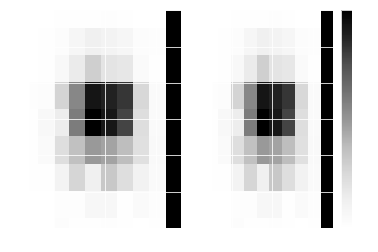

In [17]:
# find spike trigger feature
delaytime1=-0.1
delaytime2=0.05
delayind1=delaytime1*rate
delayind2=delaytime2*rate
indAll1=[]
indAll2=[]
for i in range(60):
    SpikesSingleChannel=[]
    SpikesSingleChannel=np.squeeze(Spikes[0,i])
    indSpikes=np.round(SpikesSingleChannel*rate,0)
    indStiFeature=indSpikes+delayind1
    indStiFeature=indStiFeature[(indStiFeature>0) & (indStiFeature<=len(tcut))]
    indStiFeature=indStiFeature.astype(int)
    indAll1.append(indStiFeature)
for i in range(60):
    SpikesSingleChannel2=[]
    SpikesSingleChannel2=np.squeeze(Spikes[0,i])
    indSpikes2=np.round(SpikesSingleChannel2*rate,0)
    indStiFeature2=indSpikes2+delayind2
    indStiFeature2=indStiFeature2[(indStiFeature2>0) & (indStiFeature2<=len(tcut))]
    indStiFeature2=indStiFeature2.astype(int)
    indAll2.append(indStiFeature)    

for i in range(60):
    plt.subplot(1, 2, 1)
    plt.hist2d(Xsti[indAll1[i]], Vsti[indAll1[i]], bins=(10,10), cmap=plt.cm.Greys)
    plt.grid()
    plt.xlim(-3,3)
    plt.ylim(-3,3)
    plt.subplot(1, 2, 2)
    plt.hist2d(Xsti[indAll2[i]], Vsti[indAll2[i]], bins=(10,10), cmap=plt.cm.Greys)
    plt.grid()
    plt.colorbar()
    plt.xlim(-3,3)
    plt.ylim(-3,3)
    plt.show()

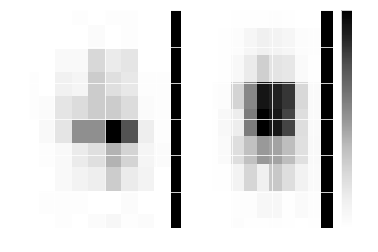

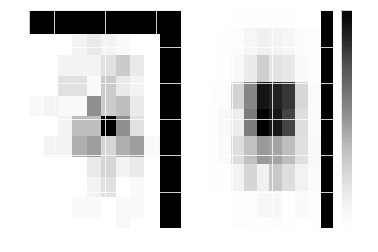

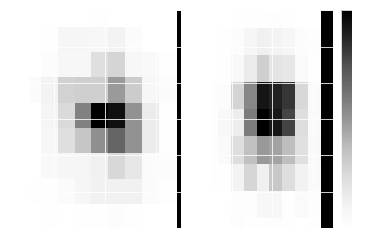

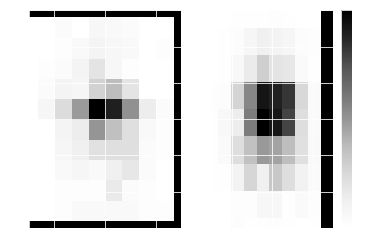

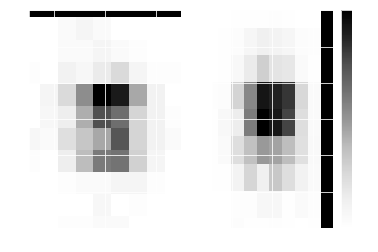

...

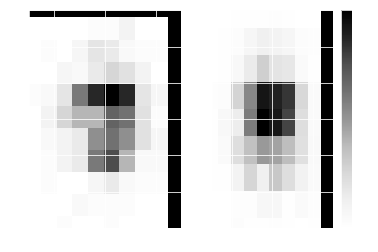

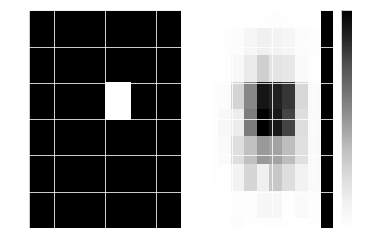

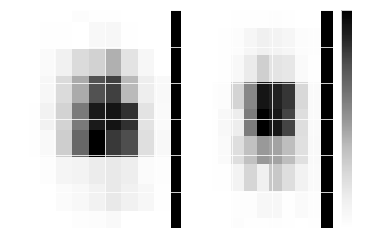

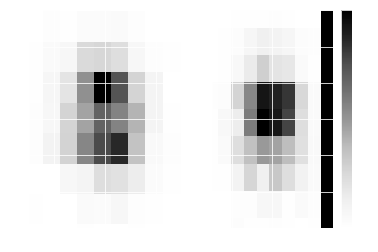

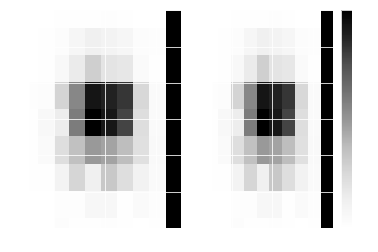